## Bibliotecas


In [ ]:
%pip install pandas
%pip install plotly
%pip install numpy
%pip install matplotlib
%pip install scikit-learn
%pip install statsmodels
%pip install prophet
%pip install joblib


Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import sklearn as sk
from pandas import to_datetime, date_range
from prophet import Prophet
from sklearn.metrics import mean_squared_error
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
import joblib
import nbformat as nbf
from nbconvert import PythonExporter

## Importação da base

In [3]:
df_anp=pd.read_csv("ipeadata[19-05-2024-05-58].csv", sep=";")

## Conhecendo a base

In [4]:
df_anp.head()

,Data,Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366,Unnamed: 2
0,20/05/1987,"18,63",NaN
1,21/05/1987,"18,45",NaN
2,22/05/1987,"18,55",NaN
3,23/05/1987,NaN,NaN
4,24/05/1987,NaN,NaN


In [5]:
df_anp.tail()

,Data,Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366,Unnamed: 2
13504,09/05/2024,"83,27",NaN
13505,10/05/2024,"83,39",NaN
13506,11/05/2024,NaN,NaN
13507,12/05/2024,NaN,NaN
13508,13/05/2024,"83,18",NaN


In [6]:
df_anp.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13509 entries, 0 to 13508
Data columns (total 3 columns):
 #   Column                                                                                                   Non-Null Count  Dtype  
---  ------                                                                                                   --------------  -----  
 0   Data                                                                                                     13509 non-null  object 
 1   Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366  11169 non-null  object 
 2   Unnamed: 2                                                                                               0 non-null      float64
dtypes: float64(1), object(2)
memory usage: 316.7+ KB


In [7]:
tamanho=df_anp.shape #tamanho do dataframe
tamanho

(13509, 3)

In [8]:
df_anp.isnull().sum() #verificando se há valores nulos

Data                                                                                                           0
Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366     2340
Unnamed: 2                                                                                                 13509
dtype: int64

## Tratando a base

In [9]:
# Removendo coluna Unnamed: 2
df_anp = df_anp.drop(columns=["Unnamed: 2"])

In [10]:
#transformando a coluna data em datetime
df_anp['Data'] = pd.to_datetime(df_anp['Data'], format='%d/%m/%Y')
df_anp["Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366"] = df_anp["Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366"].str.replace(',', '.').astype('float64')


In [11]:
#separando a data em dia, mês e ano
df_anp['Dia'] = df_anp['Data'].dt.day
df_anp['Mês'] = df_anp['Data'].dt.month
df_anp['Ano'] = df_anp['Data'].dt.year

In [12]:
df_anp.head()

,Data,Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366,Dia,Mês,Ano
0,1987-05-20,18.63,20,5,1987
1,1987-05-21,18.45,21,5,1987
2,1987-05-22,18.55,22,5,1987
3,1987-05-23,NaN,23,5,1987
4,1987-05-24,NaN,24,5,1987


In [13]:
# Renomeando colunas
df_anp.rename(columns=
              {'Preço - petróleo bruto - Brent (FOB) - US$ - Energy Information Administration (EIA) - EIA366_PBRENT366' : 'Preço petróleo Brent'
               }, inplace=True)

In [14]:
df_anp.head()

,Data,Preço petróleo Brent,Dia,Mês,Ano
0,1987-05-20,18.63,20,5,1987
1,1987-05-21,18.45,21,5,1987
2,1987-05-22,18.55,22,5,1987
3,1987-05-23,NaN,23,5,1987
4,1987-05-24,NaN,24,5,1987


In [15]:
#ordenando_colunas
df_anp = df_anp[['Data', 'Dia', 'Mês', 'Ano','Preço petróleo Brent']]

In [16]:
#verificando o resultado
df_anp.head()

,Data,Dia,Mês,Ano,Preço petróleo Brent
0,1987-05-20,20,5,1987,18.63
1,1987-05-21,21,5,1987,18.45
2,1987-05-22,22,5,1987,18.55
3,1987-05-23,23,5,1987,NaN
4,1987-05-24,24,5,1987,NaN


In [17]:
#confirmando os tipos de dados após as transformações
df_anp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13509 entries, 0 to 13508
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Data                  13509 non-null  datetime64[ns]
 1   Dia                   13509 non-null  int32         
 2   Mês                   13509 non-null  int32         
 3   Ano                   13509 non-null  int32         
 4   Preço petróleo Brent  11169 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int32(3)
memory usage: 369.5 KB


In [18]:
df_anp.isnull().sum()

Data                       0
Dia                        0
Mês                        0
Ano                        0
Preço petróleo Brent    2340
dtype: int64

In [19]:
df_anp = df_anp.dropna() 
# Atenção: # removendo valores nulos(constatei que são em sua grande maioria sabado e domingo, dias sem cotação)

In [20]:
df_anp.isnull().sum()

Data                    0
Dia                     0
Mês                     0
Ano                     0
Preço petróleo Brent    0
dtype: int64

In [21]:
#substituindo as vírgulas por ponto e convertendo a coluna Preço petróleo Brent para float
#df_anp['Preço petróleo Brent'] = df_anp['Preço petróleo Brent'].str.replace(',', '.').astype('float64')
#df_anp['Preço petróleo Brent'] = df_anp['Preço petróleo Brent'].astype('float64')

## Nova análise dos dados

In [22]:
df_anp.head()

,Data,Dia,Mês,Ano,Preço petróleo Brent
0,1987-05-20,20,5,1987,18.63
1,1987-05-21,21,5,1987,18.45
2,1987-05-22,22,5,1987,18.55
5,1987-05-25,25,5,1987,18.60
6,1987-05-26,26,5,1987,18.63


In [23]:
df_anp.to_csv('df_anp.csv', index=False)

In [24]:
#agruapando por ano e mês e calculando a média do preço do petróleo Brent
df_anp.groupby(['Ano', 'Mês'])['Preço petróleo Brent'].describe()


count       mean       std    min      25%     50%      75%    max
Ano  Mês                                                                    
1987 5      8.0  18.580000  0.058554  18.45  18.5725  18.600  18.6075  18.63
     6     21.0  18.860476  0.170777  18.65  18.7500  18.780  19.0500  19.15
     7     23.0  19.856522  0.454049  18.98  19.4900  19.830  20.2400  20.63
     8     21.0  18.979524  0.926129  17.48  18.2800  18.850  19.5000  20.95
     9     22.0  18.313182  0.289077  17.60  18.1800  18.415  18.4950  18.68
...         ...        ...       ...    ...      ...     ...      ...    ...
2024 1     22.0  80.124091  2.605123  75.47  78.3475  80.180  82.1225  84.14
     2     21.0  83.478095  1.871194  79.30  83.0100  84.080  84.7200  85.84
     3     20.0  85.408500  1.068187  83.44  84.8575  85.580  86.1725  87.36
     4     21.0  89.938095  1.812403  87.30  88.2900  89.950  91.4900  93.12
     5      8.0  83.366250  0.710391  82.44  83.0575  83.330  83.5625  84.81

[445 rows x 8 columns]

In [25]:
#agrupando por ano e dando um describe no preço do petróleo Brent
#conseguimos ver a média, desvio padrão, mínimo, máximo, quartis
df_anp.groupby('Ano')['Preço petróleo Brent'].describe().head()

,count,mean,std,min,25%,50%,75%,max
Ano,,,,,,,,
1987,160.0,18.525813,0.977190,15.03,17.8875,18.600,19.0350,20.95
1988,255.0,14.905412,1.468460,11.20,13.9800,15.130,16.1400,17.95
1989,254.0,18.228228,1.221591,16.05,17.1850,18.100,19.0725,22.25
1990,256.0,23.761445,7.742344,14.68,17.0950,20.565,30.4700,41.45
1991,257.0,20.041128,1.945543,17.60,18.7500,19.700,20.7500,30.28


In [26]:
#agrupando por mês e dando um describe no preço do petróleo Brent
#conseguimos ver a média, desvio padrão, mínimo, máximo, quartis
df_anp.groupby('Mês')['Preço petróleo Brent'].describe().head()

,count,mean,std,min,25%,50%,75%,max
Mês,,,,,,,,
1,933.0,51.041104,31.136147,10.30,21.880,46.23,75.18,115.55
2,873.0,51.885727,32.839025,9.77,20.080,47.23,71.58,124.89
3,951.0,53.338065,34.940294,10.41,19.545,50.14,76.94,133.18
4,903.0,54.393732,35.179728,9.12,19.950,50.73,83.19,126.59
5,933.0,54.544469,34.804064,13.81,19.700,49.08,75.32,129.72


In [27]:
#agrupando por ano e calculando a média do preço do petróleo Brent
#podemos identificar o maior e menor preço médio do petróleo Brent
df_anp["Preço petróleo Brent"] = pd.to_numeric(df_anp["Preço petróleo Brent"], errors='coerce')
df_anp.groupby(['Ano'])['Preço petróleo Brent'].mean().round(2).head()

Ano
1987    18.53
1988    14.91
1989    18.23
1990    23.76
1991    20.04
Name: Preço petróleo Brent, dtype: float64

In [28]:
#agrupando por mês e calculando a média do preço do petróleo Brent
#podemos identificar o mês com maior e menor preço médio do petróleo Brent
df_anp.groupby(['Mês'])['Preço petróleo Brent'].mean().round(2).head()

Mês
1    51.04
2    51.89
3    53.34
4    54.39
5    54.54
Name: Preço petróleo Brent, dtype: float64

## Gráficos

In [29]:
df_anp.head()

,Data,Dia,Mês,Ano,Preço petróleo Brent
0,1987-05-20,20,5,1987,18.63
1,1987-05-21,21,5,1987,18.45
2,1987-05-22,22,5,1987,18.55
5,1987-05-25,25,5,1987,18.60
6,1987-05-26,26,5,1987,18.63


In [30]:
df_anp_index = df_anp.set_index('Data') # definindo a coluna Data como índice
df_anp_index.drop(columns=['Dia', 'Mês', 'Ano'], inplace=True) # removendo as colunas Dia, Mês e Ano
df_anp_index.head()

,Preço petróleo Brent
Data,
1987-05-20,18.63
1987-05-21,18.45
1987-05-22,18.55
1987-05-25,18.60
1987-05-26,18.63


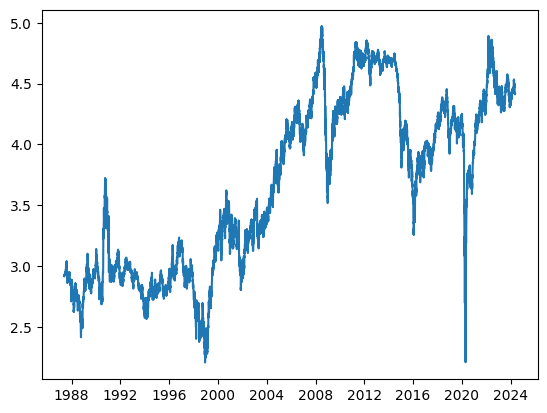

In [31]:
df_anp_index_logScale = np.log(df_anp_index) # aplicando o logaritmo natural
plt.plot(df_anp_index_logScale)


In [32]:
#plotando o gráfico de linha com o preço do petróleo Brent
px.line(df_anp, x='Data', y='Preço petróleo Brent', title='Preço do petróleo Brent',
         labels={'Preço petróleo Brent': 'Preço do petróleo Brent (US$)'})


##ESTUDAR AS CAUSAS QUE LEVARAM A ALTA DO PREÇO DO PETRÓLEO EM 2008, 2011, 2012 E 2022

In [33]:
#plotando o gráfico de linha com o preço médio do petróleo Brent por mês
df_anp_mean=df_anp.groupby(['Mês'])['Preço petróleo Brent'].mean().round(2)
fig=px.line(df_anp_mean, x=df_anp_mean.index, y='Preço petróleo Brent', title='Preço do petróleo Brent por mês',
        labels={'Preço petróleo Brent': 'Preço do petróleo Brent (US$)'})
fig.update_xaxes(tickmode = 'linear', tick0 = 1, dtick = 1)
fig.show()

##ESTUDAR AS CAUSAS QUE LEVARAM A ALTA DO PREÇO DO PETRÓLEO EM MAIO, JUNHO E JULHO

In [34]:

fig=px.box(df_anp, x='Mês', y='Preço petróleo Brent', title='Preço do petróleo Brent por mês', color='Mês')
fig.update_layout(xaxis_title='Mês', yaxis_title='Preço do petróleo Brent (US$)', showlegend=False)
fig.update_xaxes(tickmode = 'linear', tick0 = 1, dtick = 1)
fig.show()

## Machine Learning

### Prophet - teste inicial (modelo-1)


In [35]:
df_anp.head()


,Data,Dia,Mês,Ano,Preço petróleo Brent
0,1987-05-20,20,5,1987,18.63
1,1987-05-21,21,5,1987,18.45
2,1987-05-22,22,5,1987,18.55
5,1987-05-25,25,5,1987,18.60
6,1987-05-26,26,5,1987,18.63


In [36]:
df_anp.tail()

,Data,Dia,Mês,Ano,Preço petróleo Brent
13502,2024-05-07,7,5,2024,82.69
13503,2024-05-08,8,5,2024,82.44
13504,2024-05-09,9,5,2024,83.27
13505,2024-05-10,10,5,2024,83.39
13508,2024-05-13,13,5,2024,83.18


In [37]:
df_anp_prophet = df_anp[['Data', 'Preço petróleo Brent']]
df_anp_prophet.head()

,Data,Preço petróleo Brent
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
5,1987-05-25,18.60
6,1987-05-26,18.63


In [38]:
df_anp_prophet.rename(columns={"Data": "ds", "Preço petróleo Brent": "y"}, inplace=True) # renomeando as colunas
df_anp_prophet.head()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_2260\3862025937.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
5,1987-05-25,18.60
6,1987-05-26,18.63


In [39]:
df_anp_prophet.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11169 entries, 0 to 13508
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      11169 non-null  datetime64[ns]
 1   y       11169 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 261.8 KB


In [40]:
m = Prophet(changepoint_prior_scale=0.08, seasonality_prior_scale=0.08, seasonality_mode= "multiplicative", changepoint_range=0.95 ) # instanciando o modelo e testando hiperparâmetros
m.fit(df_anp_prophet) # treinando o modelo

18:09:28 - cmdstanpy - INFO - Chain [1] start processing
18:09:40 - cmdstanpy - INFO - Chain [1] done processing


In [41]:
future = m.make_future_dataframe(periods=90) # criando um dataframe com 365 dias no futuro
future.tail()

,ds
11254,2024-08-07
11255,2024-08-08
11256,2024-08-09
11257,2024-08-10
11258,2024-08-11


In [42]:
forecast = m.predict(future) # realizando a previsão
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail() # visualizando as previsões

,ds,yhat,yhat_lower,yhat_upper
11254,2024-08-07,80.069141,70.580999,89.016142
11255,2024-08-08,80.034398,70.728217,89.553650
11256,2024-08-09,79.873344,70.125572,89.200431
11257,2024-08-10,79.418300,69.257147,89.336897
11258,2024-08-11,79.440969,69.343043,89.454250


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



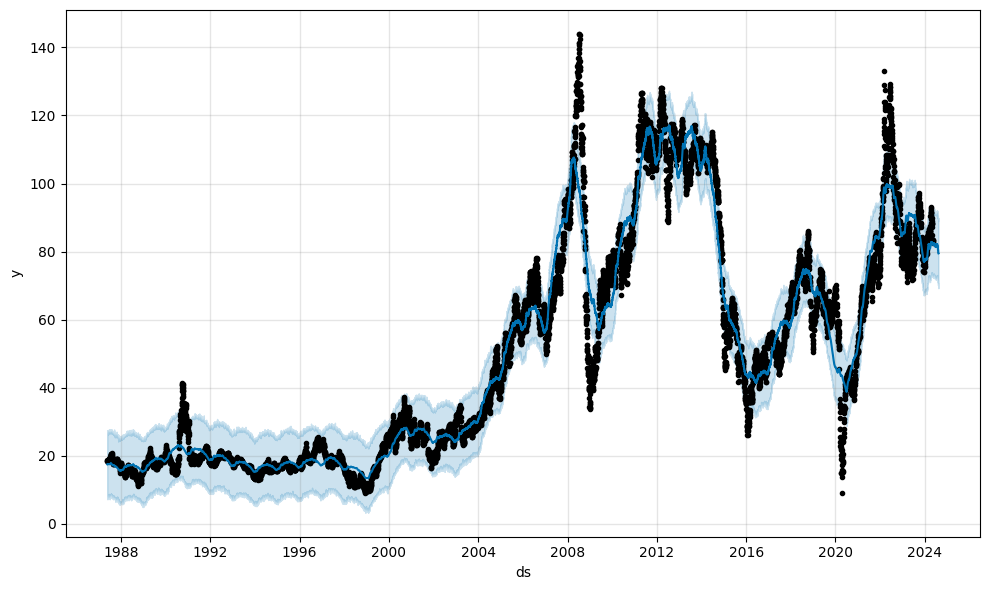

In [43]:
fig1 = m.plot(forecast) # plotando o gráfico


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array

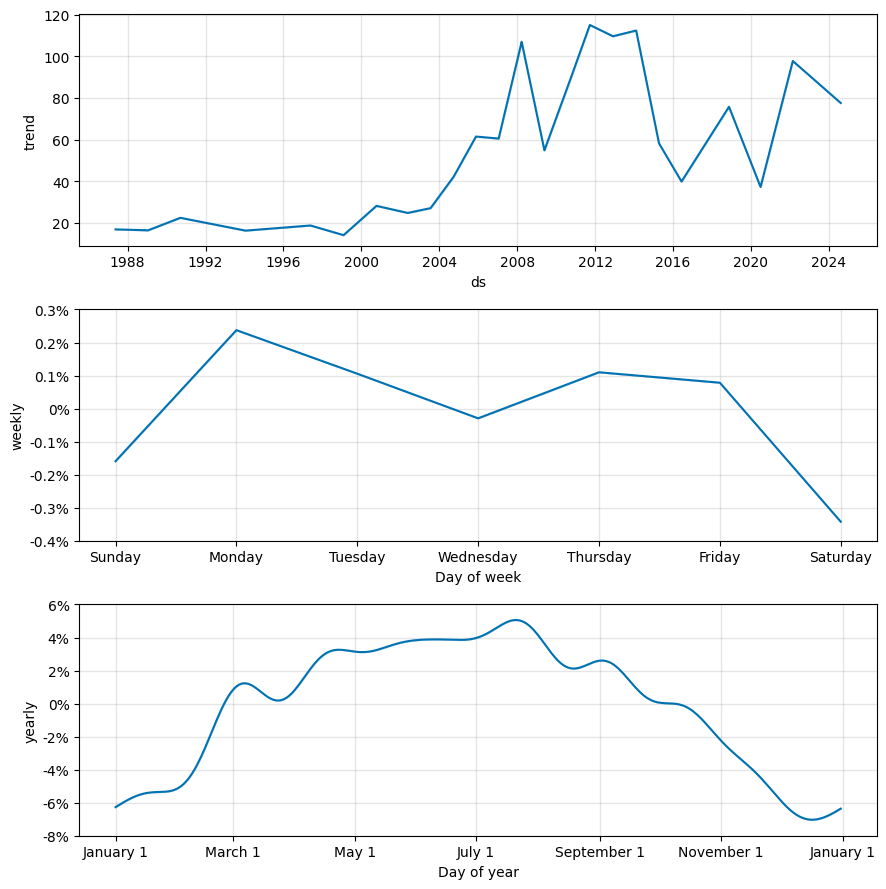

In [46]:
fig2 = m.plot_components(forecast) # plotando os componentes

In [45]:
from prophet.plot import plot_plotly, plot_components_plotly # importando as funções plot_plotly e plot_components_plotly

plot_plotly(m, forecast)

### Avaliando o Modelo (modelo-1)

In [47]:
df_anp_prophet = cross_validation(m, initial='1460, days', period='365 days', horizon = '90 days') # validação cruzada


  0%|          | 0/33 [00:00<?, ?it/s]

18:10:58 - cmdstanpy - INFO - Chain [1] start processing
18:11:00 - cmdstanpy - INFO - Chain [1] done processing
18:11:00 - cmdstanpy - INFO - Chain [1] start processing
18:11:01 - cmdstanpy - INFO - Chain [1] done processing
18:11:02 - cmdstanpy - INFO - Chain [1] start processing
18:11:04 - cmdstanpy - INFO - Chain [1] done processing
18:11:04 - cmdstanpy - INFO - Chain [1] start processing
18:11:05 - cmdstanpy - INFO - Chain [1] done processing
18:11:06 - cmdstanpy - INFO - Chain [1] start processing
18:11:08 - cmdstanpy - INFO - Chain [1] done processing
18:11:09 - cmdstanpy - INFO - Chain [1] start processing
18:11:11 - cmdstanpy - INFO - Chain [1] done processing
18:11:11 - cmdstanpy - INFO - Chain [1] start processing
18:11:13 - cmdstanpy - INFO - Chain [1] done processing
18:11:13 - cmdstanpy - INFO - Chain [1] start processing
18:11:16 - cmdstanpy - INFO - Chain [1] done processing
18:11:17 - cmdstanpy - INFO - Chain [1] start processing
18:11:19 - cmdstanpy - INFO - Chain [1]

In [48]:
df_anp_prophet.head() # visualizando as previsões

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1992-02-24,17.035442,15.622809,18.503570,17.40,1992-02-21
1,1992-02-25,16.975980,15.573753,18.345608,17.43,1992-02-21
2,1992-02-26,16.939226,15.584312,18.390915,17.28,1992-02-21
3,1992-02-27,16.959590,15.479366,18.399090,17.55,1992-02-21
4,1992-02-28,16.934053,15.415695,18.330175,17.45,1992-02-21


In [49]:
df_anp_prophet.loc[df_anp_prophet["ds"] >= "2022-01-01"] # visualizando a previsão para o partir do dia 01/01/2022

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
2310,2022-02-14,77.009815,66.897444,86.940935,101.66,2022-02-13
2311,2022-02-15,77.177143,67.397860,87.548333,98.43,2022-02-13
2312,2022-02-16,77.328862,67.035801,88.117220,97.44,2022-02-13
2313,2022-02-17,77.773922,67.632874,87.740805,95.28,2022-02-13
2314,2022-02-18,77.886091,67.534388,87.948704,96.18,2022-02-13
...,...,...,...,...,...,...
2491,2024-05-07,87.660478,77.222791,98.441767,82.69,2024-02-13
2492,2024-05-08,87.552585,77.973005,97.687488,82.44,2024-02-13
2493,2024-05-09,87.653462,77.022796,97.358692,83.27,2024-02-13
2494,2024-05-10,87.626228,77.225569,98.008097,83.39,2024-02-13


In [50]:
#cutoffs = pd.to_datetime(['2022-01-03', '2022-07-03', '2023-01-03']) # não é necessário ajustar as datas de corte, pois o cross_validation já faz isso
#df_anp_prophet_cutoffs = cross_validation(m, cutoffs=cutoffs, horizon='365 days')

# Podemos tentar melhorar o modelo ajustando os hiperparâmetros (ajustando as datas de corte)

In [51]:
#df_anp_prophet_cutoffs.head() # realizando a validação cruzada com os cortes

In [52]:
performance = performance_metrics(df_anp_prophet) 
performance.head() # visualizando as métricas

##ATENÇÃO: O MODELO DEVE SER AVALIADO, SE NÃO ESTIVER BOM, DEVE SER AJUSTADO
# Verificar se oresultado das metricas está bom, se não, tentar melhorar o modelo

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,9 days,87.661467,9.362770,5.747228,0.099216,0.077582,0.102206,0.603153
1,10 days,91.182129,9.548933,5.854925,0.102048,0.080540,0.105586,0.590915
2,11 days,95.504486,9.772640,6.015544,0.105495,0.082433,0.109153,0.588621
3,12 days,95.994290,9.797668,6.060509,0.107310,0.083360,0.111120,0.573628
4,13 days,94.832871,9.738217,6.048740,0.108724,0.085370,0.112689,0.553356


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:546: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:547: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



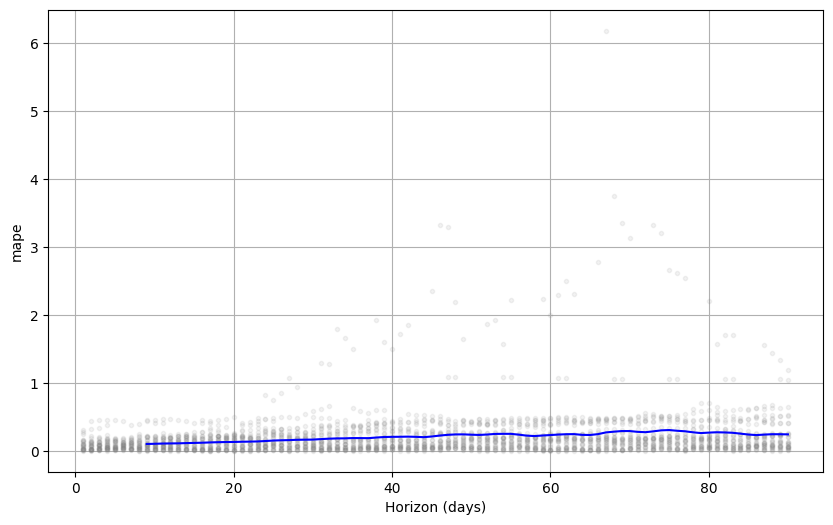

In [53]:
fig = plot_cross_validation_metric(df_anp_prophet, metric='mape', rolling_window=0.1) # plotando o gráfico


### Prophet - testando o modelo com uma base menor (10 anos) (modelo-2)

In [54]:
df_anp.tail()

,Data,Dia,Mês,Ano,Preço petróleo Brent
13502,2024-05-07,7,5,2024,82.69
13503,2024-05-08,8,5,2024,82.44
13504,2024-05-09,9,5,2024,83.27
13505,2024-05-10,10,5,2024,83.39
13508,2024-05-13,13,5,2024,83.18


In [63]:
df_anp_range_10_anos = df_anp[(df_anp['Data'] >= '2014-05-13')]# selecionando o intervalo de 10 anos
df_anp_range_10_anos.head()

,Data,Dia,Mês,Ano,Preço petróleo Brent
9855,2014-05-13,13,5,2014,108.26
9856,2014-05-14,14,5,2014,109.87
9857,2014-05-15,15,5,2014,109.74
9858,2014-05-16,16,5,2014,108.37
9859,2014-05-17,17,5,2014,108.78


In [64]:
df_anp_range_10_anos_prophet = df_anp_range_10_anos[['Data', 'Preço petróleo Brent']] # selecionando as colunas Data e Preço petróleo Brent
df_anp_range_10_anos_prophet.head()

,Data,Preço petróleo Brent
9855,2014-05-13,108.26
9856,2014-05-14,109.87
9857,2014-05-15,109.74
9858,2014-05-16,108.37
9859,2014-05-17,108.78


In [65]:
df_anp_range_10_anos_prophet.rename(columns={"Data":"ds", "Preço petróleo Brent":"y"}, inplace=True) # renomeando as colunas
df_anp_range_10_anos_prophet.head()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_2260\2068926842.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
9855,2014-05-13,108.26
9856,2014-05-14,109.87
9857,2014-05-15,109.74
9858,2014-05-16,108.37
9859,2014-05-17,108.78


In [66]:
m2 = Prophet(changepoint_prior_scale=0.08, seasonality_prior_scale=0.08, seasonality_mode= "multiplicative", changepoint_range=0.95 )
m2.fit(df_anp_range_10_anos_prophet)

18:22:34 - cmdstanpy - INFO - Chain [1] start processing
18:22:36 - cmdstanpy - INFO - Chain [1] done processing


In [71]:
future2 = m2.make_future_dataframe(periods=15) # criando um dataframe com 90 dias no futuro (pode ser alterado para tentar uma previsão melhor)
future2.tail()

,ds
3023,2024-05-24
3024,2024-05-25
3025,2024-05-26
3026,2024-05-27
3027,2024-05-28


In [72]:
forecast2 = m2.predict(future2)
forecast2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].to_csv("forecast2.csv")
forecast2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]


,ds,yhat,yhat_lower,yhat_upper
0,2014-05-13,116.705749,109.028831,123.819862
1,2014-05-14,116.417464,108.852321,124.188612
2,2014-05-15,116.377352,108.815407,123.767247
3,2014-05-16,116.712433,109.331015,124.546510
4,2014-05-17,115.922957,108.103441,123.906934
...,...,...,...,...
3023,2024-05-24,91.115186,82.874566,99.006003
3024,2024-05-25,90.593255,82.651540,98.259829
3025,2024-05-26,91.288863,83.172873,99.353817
3026,2024-05-27,91.450500,83.536407,99.123442


Text(83.34722222222221, 0.5, 'Preço do petróleo Brent (US$)')

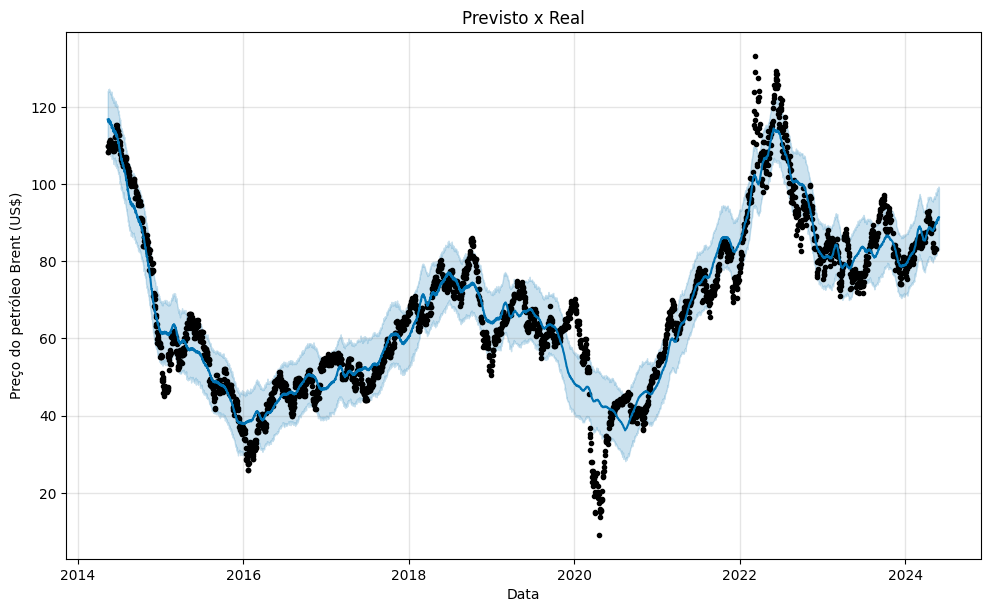

In [103]:
fig1 = m2.plot(forecast2)
plt.title('Previsto x Real')
plt.xlabel('Data')
plt.ylabel('Preço do petróleo Brent (US$)')

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array

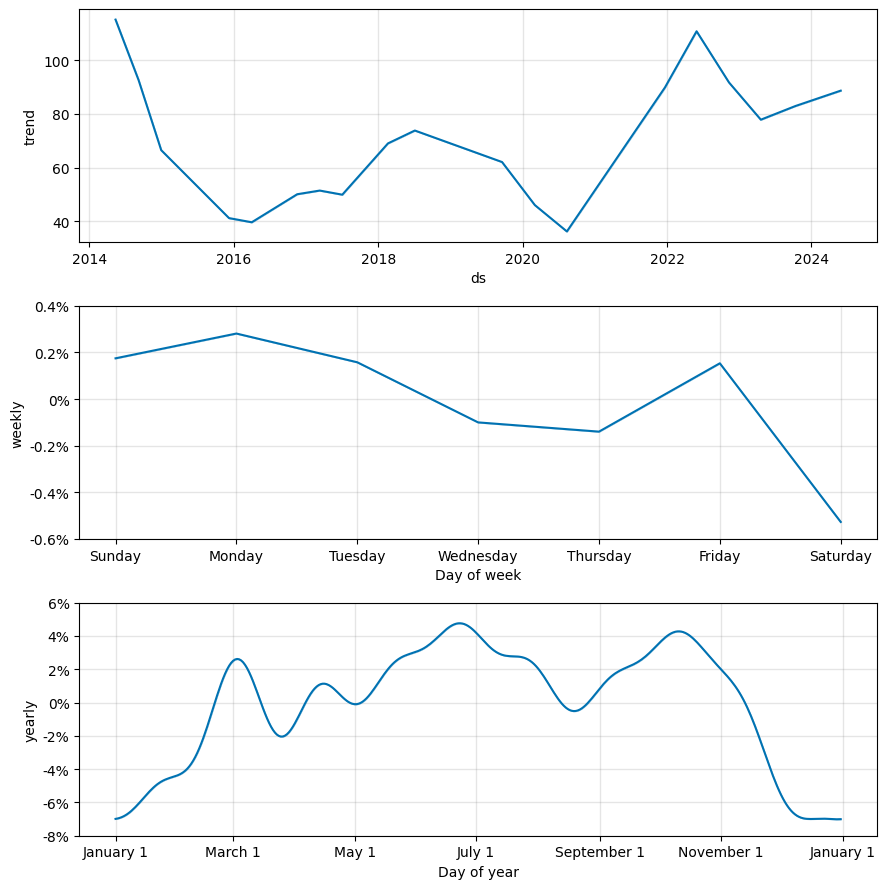

In [75]:
fig2 = m2.plot_components(forecast2)

In [76]:
plot_plotly(m2, forecast2)

In [77]:
plot_components_plotly(m2, forecast2)

### Avaliando o Modelo (modelo-2)

In [105]:
df_anp_range_10_anos_prophet_cv = cross_validation(m2, initial='730 days', period='180 days', horizon = '15 days')

  0%|          | 0/17 [00:00<?, ?it/s]

19:43:13 - cmdstanpy - INFO - Chain [1] start processing
19:43:13 - cmdstanpy - INFO - Chain [1] done processing
19:43:14 - cmdstanpy - INFO - Chain [1] start processing
19:43:15 - cmdstanpy - INFO - Chain [1] done processing
19:43:15 - cmdstanpy - INFO - Chain [1] start processing
19:43:17 - cmdstanpy - INFO - Chain [1] done processing
19:43:18 - cmdstanpy - INFO - Chain [1] start processing
19:43:23 - cmdstanpy - INFO - Chain [1] done processing
19:43:24 - cmdstanpy - INFO - Chain [1] start processing
19:43:27 - cmdstanpy - INFO - Chain [1] done processing
19:43:28 - cmdstanpy - INFO - Chain [1] start processing
19:43:30 - cmdstanpy - INFO - Chain [1] done processing
19:43:31 - cmdstanpy - INFO - Chain [1] start processing
19:43:34 - cmdstanpy - INFO - Chain [1] done processing
19:43:35 - cmdstanpy - INFO - Chain [1] start processing
19:43:37 - cmdstanpy - INFO - Chain [1] done processing
19:43:38 - cmdstanpy - INFO - Chain [1] start processing
19:43:41 - cmdstanpy - INFO - Chain [1]

In [106]:
df_anp_range_10_anos_prophet_cv.sort_values("ds", ascending=False)

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
199,2024-05-13,90.067518,81.859749,98.249822,83.18,2024-04-28
198,2024-05-10,89.436574,81.426857,97.380667,83.39,2024-04-28
197,2024-05-09,88.985967,80.966923,96.839849,83.27,2024-04-28
196,2024-05-08,88.872149,81.161114,96.706759,82.44,2024-04-28
195,2024-05-07,88.927006,80.908631,95.845395,82.69,2024-04-28
...,...,...,...,...,...,...
4,2016-06-14,49.754437,47.451138,51.998792,47.88,2016-06-09
3,2016-06-13,49.621005,47.307446,51.785540,49.09,2016-06-09
2,2016-06-12,49.462811,47.073027,51.797752,50.52,2016-06-09
1,2016-06-11,49.234460,46.985738,51.528397,51.23,2016-06-09


In [107]:
performance2 = performance_metrics(df_anp_range_10_anos_prophet_cv)
performance2.head(30)

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,2 days,73.912025,8.597210,6.044722,0.109115,0.038501,0.128355,0.565385
1,3 days,71.235679,8.440123,6.282657,0.113154,0.098258,0.132388,0.538462
2,4 days,49.437104,7.031152,5.536220,0.091004,0.061009,0.098846,0.565385
3,5 days,33.274119,5.768372,4.741426,0.073584,0.067598,0.073851,0.625000
4,6 days,55.954049,7.480244,5.628278,0.101057,0.057608,0.116725,0.575000
5,7 days,74.591407,8.636632,6.434487,0.119429,0.071088,0.142060,0.511538
6,8 days,74.658247,8.640500,6.560725,0.123511,0.058710,0.147981,0.525000
7,9 days,84.069704,9.168953,7.020231,0.128827,0.090020,0.154017,0.461538
8,10 days,88.047826,9.383380,7.505573,0.136666,0.084704,0.162611,0.428571
9,11 days,68.524460,8.277950,7.092488,0.117644,0.081138,0.126932,0.400000


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:546: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:547: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



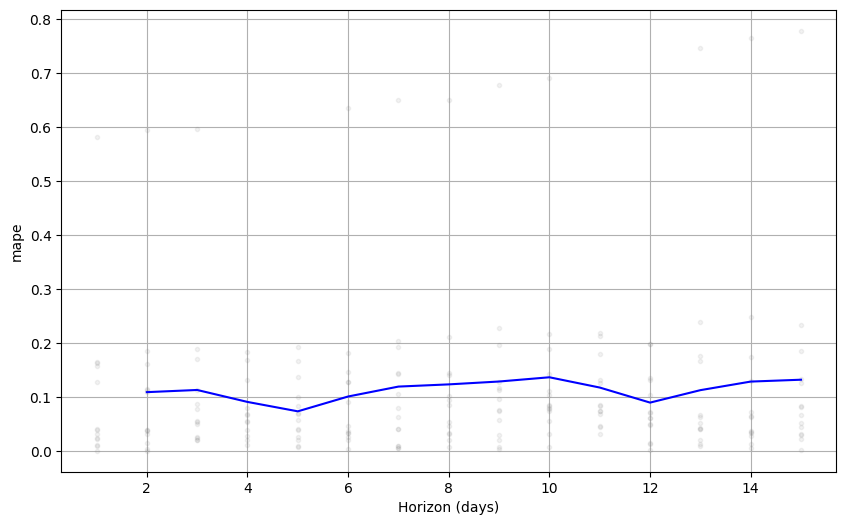

In [81]:
fig = plot_cross_validation_metric(df_anp_range_10_anos_prophet_cv, metric='mape', rolling_window=0.1)


### Prophet - testando o modelo sem o periodo da pandemia (modelo-3)

In [82]:
df_anp_prophet_rename = df_anp.rename(columns={'Data': 'ds', 'Preço petróleo Brent': 'y'})
df_anp_prophet3 =df_anp_prophet_rename[["ds","y"]]
df_anp_prophet3.head()

,ds,y
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
5,1987-05-25,18.60
6,1987-05-26,18.63


In [83]:
# Selecionei um intervalo começamdo em 2014-01-01 e pulando um range de ('2021-03-20', '2023-05-05') para rodar o modelo-3
df_anp_prophet3 = df_anp_prophet3.loc[(~df_anp_prophet3['ds'].isin(date_range(start='2021-03-20', end='2023-05-05')))]
df_anp_prophet3.tail()


,ds,y
13502,2024-05-07,82.69
13503,2024-05-08,82.44
13504,2024-05-09,83.27
13505,2024-05-10,83.39
13508,2024-05-13,83.18


In [100]:
df_anp_prophet3.shape

(1693, 6)

In [86]:
m3 = Prophet()
m3.fit(df_anp_prophet3)


18:43:07 - cmdstanpy - INFO - Chain [1] start processing
18:43:22 - cmdstanpy - INFO - Chain [1] done processing


In [87]:
future3 = m3.make_future_dataframe(periods=120)
future3.tail()

,ds
10741,2024-09-06
10742,2024-09-07
10743,2024-09-08
10744,2024-09-09
10745,2024-09-10


In [88]:
forecast3 = m3.predict(future3)
forecast3[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,1987-05-20,17.254952,3.304635,29.948894
1,1987-05-21,17.376780,5.046793,30.194580
2,1987-05-22,17.351897,4.900023,29.742868
3,1987-05-25,17.330169,5.400979,29.657199
4,1987-05-26,17.290265,4.055882,30.188382
...,...,...,...,...
10741,2024-09-06,79.146895,65.659369,91.279506
10742,2024-09-07,79.548414,66.845169,91.767509
10743,2024-09-08,78.899295,66.736860,91.894432
10744,2024-09-09,79.073654,65.806603,91.431911


In [89]:
forecast3 = m3.predict(future3)
forecast3[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
10741,2024-09-06,79.146895,66.955681,92.168445
10742,2024-09-07,79.548414,67.393330,92.228818
10743,2024-09-08,78.899295,65.575182,92.010531
10744,2024-09-09,79.073654,66.138951,90.892282
10745,2024-09-10,79.014332,66.190597,91.745187


In [90]:
forecast3.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
10741,2024-09-06,77.335115,66.955681,92.168445,77.316398,77.335115,1.811781,1.811781,1.811781,-0.011762,-0.011762,-0.011762,1.823542,1.823542,1.823542,0.0,0.0,0.0,79.146895
10742,2024-09-07,77.343686,67.393330,92.228818,77.319840,77.346673,2.204728,2.204728,2.204728,0.404876,0.404876,0.404876,1.799851,1.799851,1.799851,0.0,0.0,0.0,79.548414
10743,2024-09-08,77.352257,65.575182,92.010531,77.316388,77.360539,1.547038,1.547038,1.547038,-0.224753,-0.224753,-0.224753,1.771791,1.771791,1.771791,0.0,0.0,0.0,78.899295
10744,2024-09-09,77.360828,66.138951,90.892282,77.319656,77.373712,1.712826,1.712826,1.712826,-0.026876,-0.026876,-0.026876,1.739702,1.739702,1.739702,0.0,0.0,0.0,79.073654
10745,2024-09-10,77.369399,66.190597,91.745187,77.323328,77.387960,1.644932,1.644932,1.644932,-0.059076,-0.059076,-0.059076,1.704009,1.704009,1.704009,0.0,0.0,0.0,79.014332


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



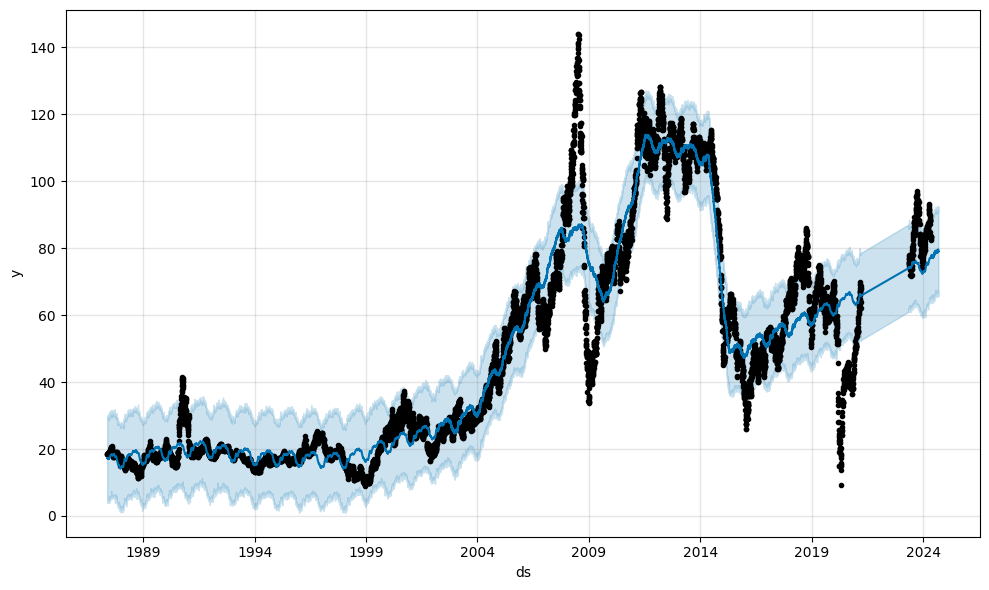

In [91]:
fig1 = m3.plot(forecast3)

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array

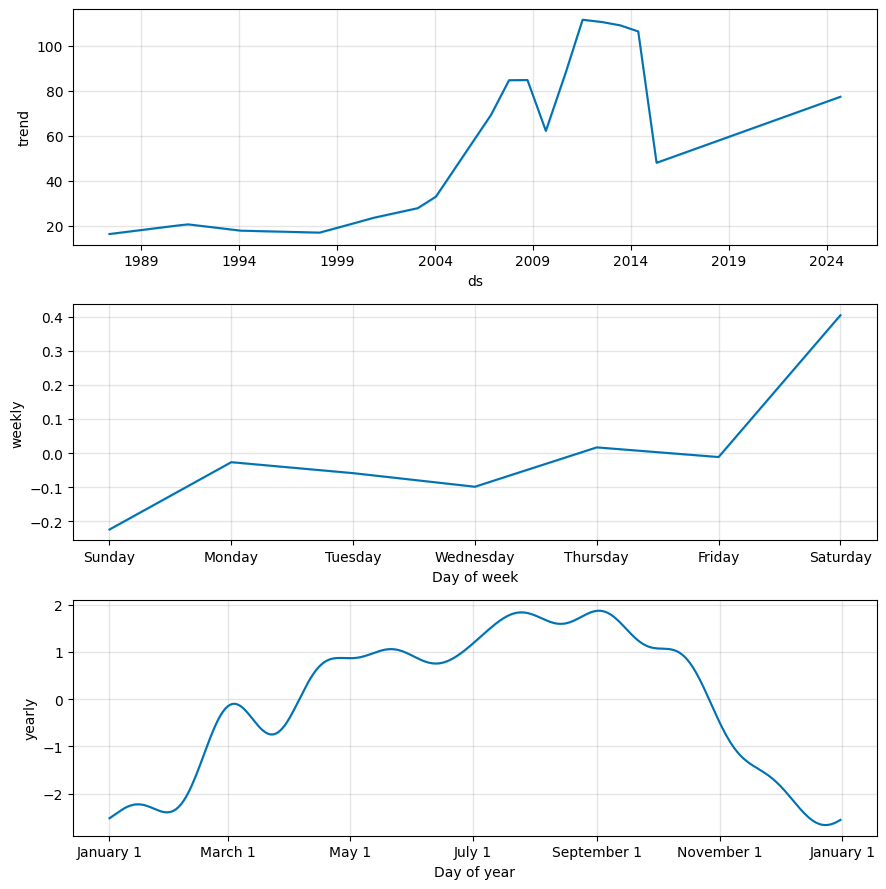

In [92]:
fig2 = m3.plot_components(forecast3)



In [93]:
plot_plotly(m3, forecast3)

In [94]:
plot_components_plotly(m, forecast3)



### Avaliando o Modelo (modelo-3)


In [95]:
df_anp_prophet3 = cross_validation(m3, initial='730 days', period='180 days', horizon = '30 days')

  0%|          | 0/68 [00:00<?, ?it/s]

18:45:36 - cmdstanpy - INFO - Chain [1] start processing
18:45:36 - cmdstanpy - INFO - Chain [1] done processing
18:45:36 - cmdstanpy - INFO - Chain [1] start processing
18:45:37 - cmdstanpy - INFO - Chain [1] done processing
18:45:37 - cmdstanpy - INFO - Chain [1] start processing
18:45:38 - cmdstanpy - INFO - Chain [1] done processing
18:45:38 - cmdstanpy - INFO - Chain [1] start processing
18:45:38 - cmdstanpy - INFO - Chain [1] done processing
18:45:39 - cmdstanpy - INFO - Chain [1] start processing
18:45:39 - cmdstanpy - INFO - Chain [1] done processing
18:45:40 - cmdstanpy - INFO - Chain [1] start processing
18:45:40 - cmdstanpy - INFO - Chain [1] done processing
18:45:41 - cmdstanpy - INFO - Chain [1] start processing
18:45:41 - cmdstanpy - INFO - Chain [1] done processing
18:45:42 - cmdstanpy - INFO - Chain [1] start processing
18:45:43 - cmdstanpy - INFO - Chain [1] done processing
18:45:44 - cmdstanpy - INFO - Chain [1] start processing
18:45:44 - cmdstanpy - INFO - Chain [1]

In [96]:
df_anp_prophet3.head()


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1989-08-07,16.669855,16.035224,17.382452,16.05,1989-08-04
1,1989-08-08,16.595378,15.914521,17.268106,16.28,1989-08-04
2,1989-08-09,16.556413,15.876035,17.222300,16.45,1989-08-04
3,1989-08-10,16.521570,15.789812,17.217902,16.93,1989-08-04
4,1989-08-11,16.454860,15.729708,17.196422,17.00,1989-08-04


In [97]:
performance3 = performance_metrics(df_anp_prophet3)
performance3.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,4 days,287.706562,16.961915,11.708198,0.216679,0.154064,0.212450,0.430396
1,5 days,283.813354,16.846761,11.599480,0.218104,0.154031,0.214120,0.435378
2,6 days,278.669485,16.693396,11.479634,0.217758,0.153282,0.211998,0.421343
3,7 days,281.570768,16.780071,11.506651,0.215508,0.150075,0.210061,0.429357
4,8 days,287.310596,16.950239,11.678233,0.217229,0.147574,0.211310,0.416796


c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:546: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.

c:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:547: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



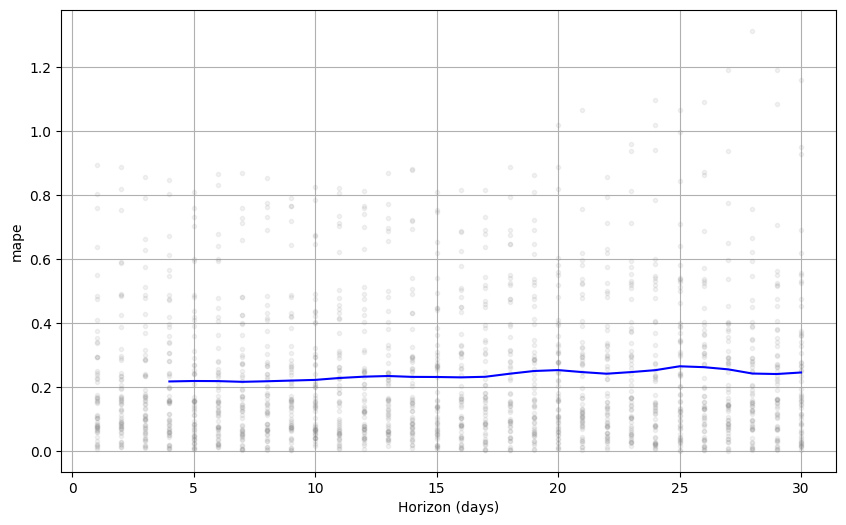

In [98]:
fig = plot_cross_validation_metric(df_anp_prophet3, metric='mape')

### Salvando o Modelo

In [99]:
joblib.dump(m3, 'modelo_prophet.pkl') # salvando o modelo

['modelo_prophet.pkl']

#### O modelo 2 foi o melhor modelo